<a href="https://colab.research.google.com/github/irsyaddani/Machine-Learning-TI-3E-2024/blob/main/Week7_17.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Nama: Irsyad Danisaputra
<br> NIM: 2241720233
<br> Kelas: TI-3E
<br> Absen: 17

1. Buatlah fungsi konvolusi menggunakan algoritma yang telah dijelaskan pada Bagian C, tanpa menggunakan library atau metode konvolusi dari OpenCV.

2. Berikut merupakan langkah-langkah yang dapat dilakukan:

  a. Buat notebook baru pada google colab, dan beri nama Week7.ipynb. Simpan Salinan pada akun github seperti pada modul sebelumnya.

b. Akses file yang terdapat pada drive dan import beberapa library yang dibutuhkan

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import numpy as np
from matplotlib import pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

c. Buatlah fungsi konvolusi. Catatan: parameter yang digunakan boleh dimodifikasi. Misal, hanya menggunakan parameter image dan kernel saja, atau image, kernel dan padding.

In [6]:
def convolution2d(image, kernel, stride=1, padding=0):
    # Get image and kernel dimensions
    image_h, image_w = image.shape
    kernel_h, kernel_w = kernel.shape

    # Flip the kernel (for convolution)
    kernel = np.flipud(np.fliplr(kernel))

    # Add padding to the image
    if padding > 0:
        image_padded = np.pad(image, ((padding, padding), (padding, padding)), mode='constant')
    else:
        image_padded = image

    # Calculate the dimensions of the output
    output_h = (image_h + 2 * padding - kernel_h) // stride + 1
    output_w = (image_w + 2 * padding - kernel_w) // stride + 1

    # Initialize the output matrix
    output = np.zeros((output_h, output_w))

     # Perform the convolution operation
    for y in range(0, output_h):
        for x in range(0, output_w):
            # Extract the region of interest from the image
            y_start, x_start = y * stride, x * stride
            y_end, x_end = y_start + kernel_h, x_start + kernel_w
            region = image_padded[y_start:y_end, x_start:x_end]

            # Perform element-wise multiplication and sum
            output[y, x] = np.sum(region * kernel)

    return output

d. Load citra yang akan diproses dan ubah menjadi citra keabuan

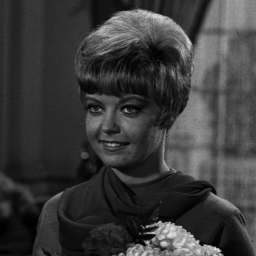

In [7]:
img = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/female.tiff')
img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
cv2_imshow(img)

kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])

3. Buat Image Filter untuk Average filter, low pass filter, high pass filter, dan beberapa filter berikut:

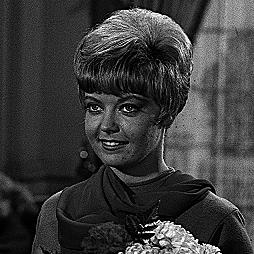

In [8]:
# Sharpen
output = convolution2d(img, kernel_sharpen, stride=1, padding=0)
cv2_imshow(output)

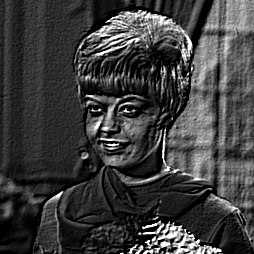

In [9]:
# Emboss
kernel_emboss = np.array([[-2,-1,0],
                           [-1,1,1],
                           [0,1,2]])
output = convolution2d(img, kernel_emboss, stride=1, padding=0)
cv2_imshow(output)

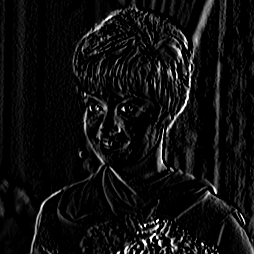

In [10]:
# Left Sobel Edge Detection
kernel_sobel_x = np.array([[1,0,-1],
                           [2,0,-2],
                           [1,0,-1]])
output = convolution2d(img, kernel_sobel_x, stride=1, padding=0)
cv2_imshow(output)

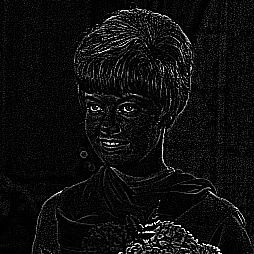

In [11]:
# Canny Edge Detection
kernel_cany = np.array([[-1,-1,-1],
                        [-1,8,-1],
                        [-1,-1,-1]])
output = convolution2d(img, kernel_cany, stride=1, padding=0)
cv2_imshow(output)

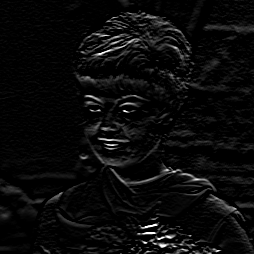

In [12]:
# Prewitt Edge Detection
kernel_prewitt = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])
output = convolution2d(img, kernel_prewitt, stride=1, padding=0)
cv2_imshow(output)

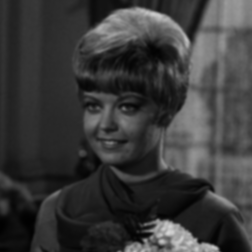

In [13]:
# 5x5 Gaussian Blur
kernel_gaussian_blur =(1/256) * np.array([[1, 4, 6, 4, 1],
                                      [4, 16, 24, 16, 4],
                                      [6, 24, 36, 24, 6],
                                      [4, 16, 24, 16, 4],
                                      [1, 4, 6, 4, 1]])
output = convolution2d(img, kernel_gaussian_blur, stride=1, padding=0)
cv2_imshow(output)

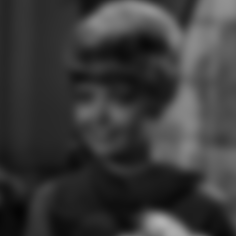

In [14]:
# 21x21 Gaussian Blur
# Define kernel size and calculate sigma
kernel_size = 21
sigma = math.sqrt(kernel_size)

# Generate a 1D Gaussian kernel using OpenCV
gaussian_kernel_1d = cv.getGaussianKernel(kernel_size, sigma)

# Create the 2D Gaussian kernel by multiplying the 1D kernel with its transpose
gaussian_kernel_2d = gaussian_kernel_1d @ gaussian_kernel_1d.T

output = convolution2d(img, gaussian_kernel_2d, stride=1, padding=0)
cv2_imshow(output)

3. Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui implementasi teknik filterisasi dan detection setiap citra.
Terapkan juga histogram equalization dan operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

In [15]:
def Brightness (image, brightness):
  brightness_image = np.zeros(image.shape, image.dtype)

  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        brightness_image[y,x,c] = np.clip(image[y,x,c] + brightness, 0, 255)

  return brightness_image

def hist_equ (image):
  channels = cv.split(image)
  eq_channels = []
  for ch, color in zip(channels, ["r", "g", "b"]):
    eq_channels.append(cv.equalizeHist(ch))

  eq_image = cv.merge(eq_channels)
  return eq_image

def adjust_contrast(image, alpha):
  adjusted_image = cv.convertScaleAbs(image, alpha=alpha, beta=0)
  return adjusted_image

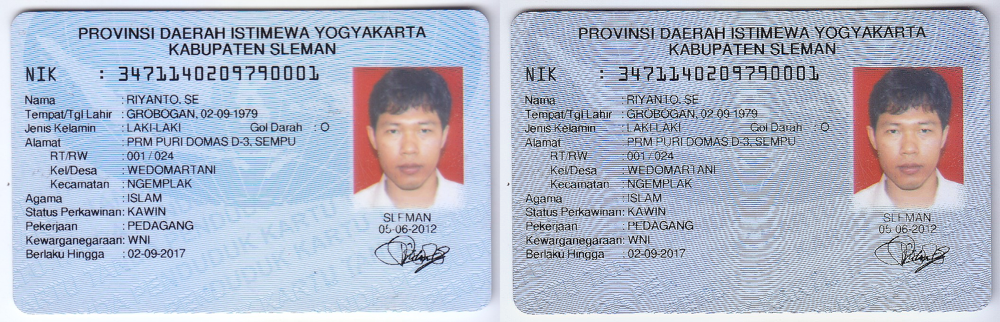

In [22]:
ktp = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp.png')
brightness = Brightness(ktp, -10)
result = cv.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp, result))
cv2_imshow(final_frame)

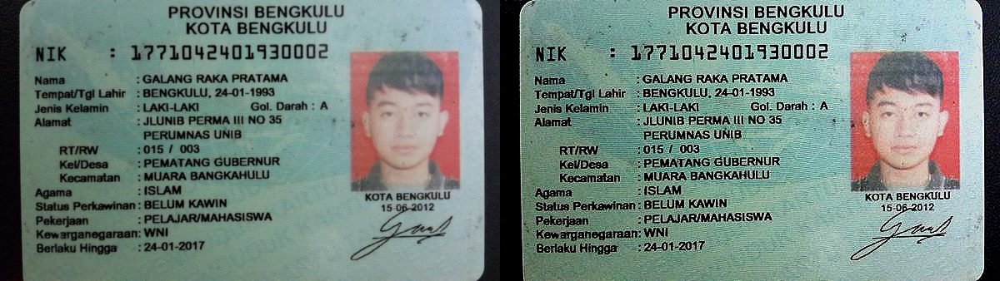

In [23]:
ktp1 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp1.png')
contrast = adjust_contrast(ktp1, 1.3)
brightness = Brightness(contrast, -30)
result = cv.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp1, result))
cv2_imshow(final_frame)

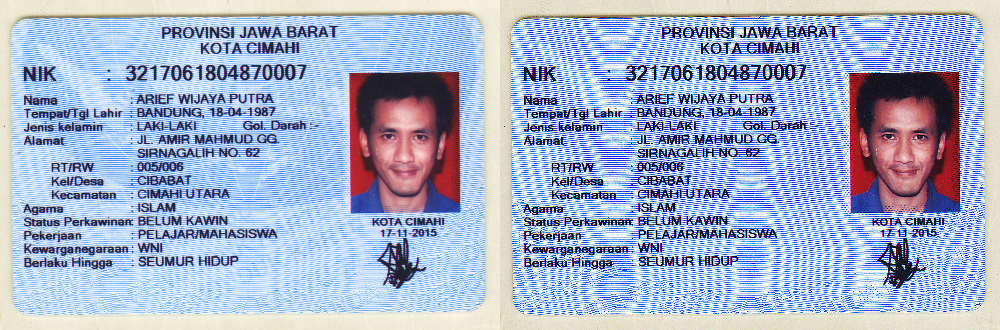

In [24]:
ktp2 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp2.png')
brightness = Brightness(ktp2, -10)
result = cv.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp2, result))
cv2_imshow(final_frame)


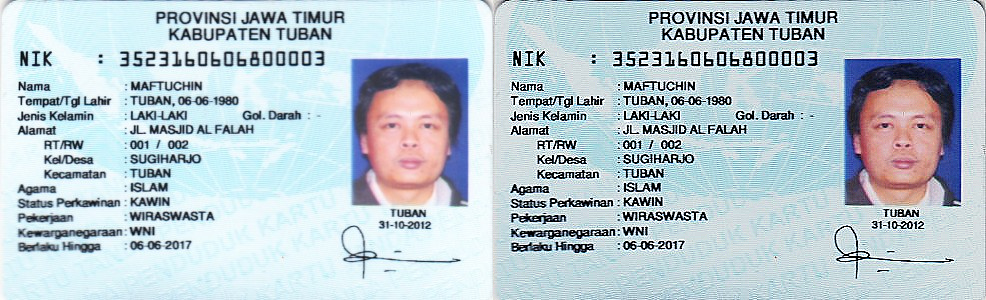

In [25]:
ktp3 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp3.png')
brightness = Brightness(ktp3, -30)
result = cv.filter2D(brightness, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp3, result))
cv2_imshow(final_frame)


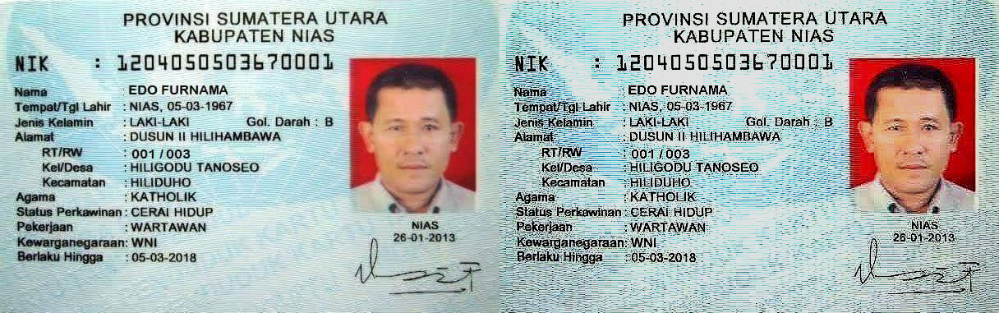

In [28]:
ktp5 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp5.png')
contrast = adjust_contrast(ktp5, 1.2)
brightness = Brightness(result, -30)
result = cv.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp5, brightness))
cv2_imshow(final_frame)

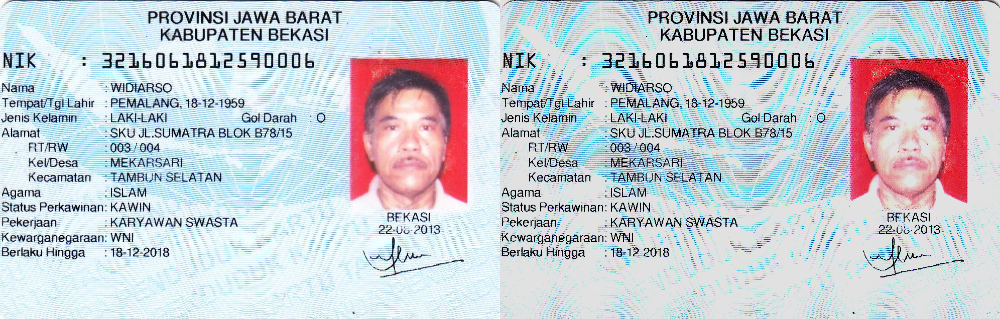

In [37]:
ktp6 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp6.png')
contrast = adjust_contrast(ktp6, 1.2)
brightness = Brightness(result, -30)
result = cv.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp6, brightness))
cv2_imshow(final_frame)

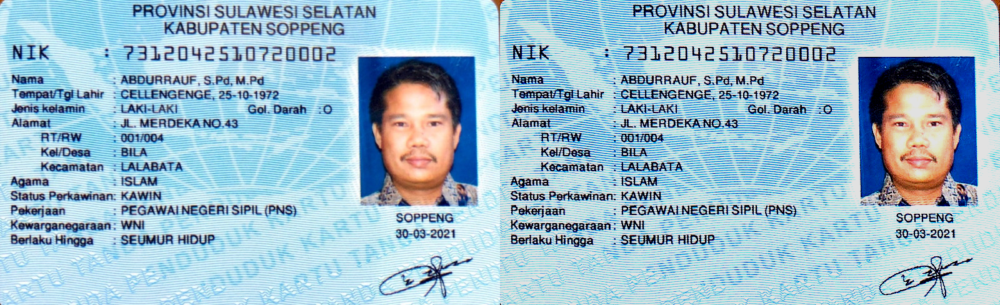

In [31]:
ktp7 = cv.imread('/content/drive/MyDrive/Kuliah/Semester5/PCVK/Modul7/assets/ktp7.jpeg')
contrast = adjust_contrast(ktp7, 1.2)
brightness = Brightness(result, -30)
result = cv.filter2D(contrast, -1, kernel_sharpen)
final_frame = cv.hconcat((ktp7, brightness))
cv2_imshow(final_frame)